## Image Segmentation Using Mask R-CNN

In [ ]:
# Import and mount Google Drive.

from google.colab import drive

drive.mount("/content/drive")

Mounted at /content/drive


Unzip Dataset

In [ ]:
# Unzip the dataset file and store it in a folder called images.

!unzip "/content/drive/MyDrive/Colab Notebooks/Ass/RM_Segmentation_Assignment_dataset (1).zip" -d "/content/drive/MyDrive/Colab Notebooks/Ass/coco2017/"

Archive:  /content/drive/MyDrive/Colab Notebooks/Ass/RM_Segmentation_Assignment_dataset (1).zip
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000000001751.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000000001380.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000000001643.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000000001583.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000000001685.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000000001482.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000000001494.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000000001551.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000000001654.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Ass/coco2017/test-30/000

Imports & Environment Setup

In [61]:
# Built-in and common libraries
import os              # For file and path handling
import json            # For JSON file reading/writing
import random          # For random sampling
import numpy as np     # For numerical operations
import matplotlib.pyplot as plt  # For plotting graphs and images
from PIL import Image  # For image loading and processing
import cv2             # For image processing tasks
from tqdm import tqdm  # For progress bars during loops

# COCO dataset and evaluation tools
from pycocotools.coco import COCO            # To load COCO dataset annotations
from pycocotools.cocoeval import COCOeval   # To evaluate model predictions with COCO metrics
from pycocotools import mask as mask_utils   # For handling masks (RLE encoding/decoding)

# PyTorch and torchvision for deep learning tasks
import torch                                 # Core PyTorch library
from torch.utils.data import Dataset, DataLoader  # Dataset and DataLoader for batching
import torchvision.transforms as T          # Standard image transforms (e.g., ToTensor, augmentation)
import torchvision.transforms.functional as F  # Functional transforms on images
from torchvision.models.detection import maskrcnn_resnet50_fpn  # Pretrained Mask R-CNN model
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor  # Replace box predictor head
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor  # Replace mask predictor head
from torchvision.transforms.functional import to_tensor

# Set device to GPU if available, else CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



Using device: cuda


Dataset Paths and Class Definitions

In [ ]:
# Target classes (4 categories)
target_classes = ['cake', 'car', 'dog', 'person']

# Number of classes = target classes + background
NUM_CLASSES = len(target_classes) + 1

# Base dataset directory in Google Drive
base_dir = "/content/drive/MyDrive/Colab Notebooks/Ass/coco2017"

# Training image and label paths
train_img_dir = f"{base_dir}/train-300/data"        # Train images
train_ann_path = f"{base_dir}/train-300/labels.json"  # Train annotations

# Validation image and label paths
val_img_dir = f"{base_dir}/validation-300/data"        # Validation images
val_ann_path = f"{base_dir}/validation-300/labels.json"  # Validation annotations

# Test image folder (no labels)
test_img_dir = f"{base_dir}/test-30"  # Test images only


EDA 1: Plot Class Distribution in Dataset

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


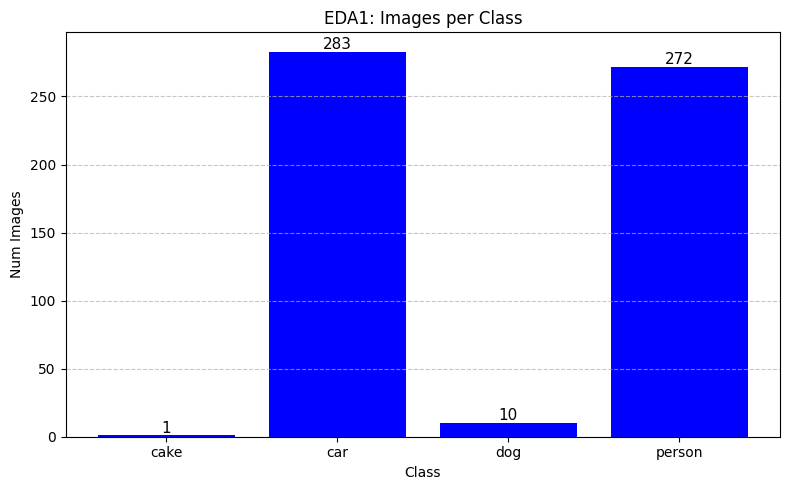

In [62]:
coco = COCO(train_ann_path)                # Load COCO annotations from JSON

def eda1_num_images_containing_classes(coco, target_classes):
    """
    EDA1: Plot number of images containing each target class.
    """
    class_img_counts = {}                   # Dictionary to hold counts per class

    for cls in target_classes:              # Loop over each class name
        cat_id = coco.getCatIds(catNms=[cls])[0]    # Get COCO category ID for class
        img_ids = coco.getImgIds(catIds=[cat_id])   # Get all image IDs containing this class
        class_img_counts[cls] = len(img_ids)        # Store number of images for this class

    plt.figure(figsize=(8, 5))              # Create a figure for the bar plot
    bars = plt.bar(class_img_counts.keys(), class_img_counts.values(), color='blue')  # Plot bars
    plt.title("EDA1: Images per Class")     # Title of the plot
    plt.xlabel("Class")                     # Label x-axis
    plt.ylabel("Num Images")                # Label y-axis
    plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines on y-axis with style

    for bar in bars:                        # Loop over each bar
        yval = bar.get_height()             # Get bar height (count)
        plt.text(bar.get_x() + bar.get_width()/2, yval + 2, yval, ha='center', fontsize=11)  # Display count above bar

    plt.tight_layout()                      # Adjust layout to fit labels
    plt.show()                             # Show the plot

# Call function to run the plot
eda1_num_images_containing_classes(coco, target_classes)


EDA 2: Number of Instances per Class

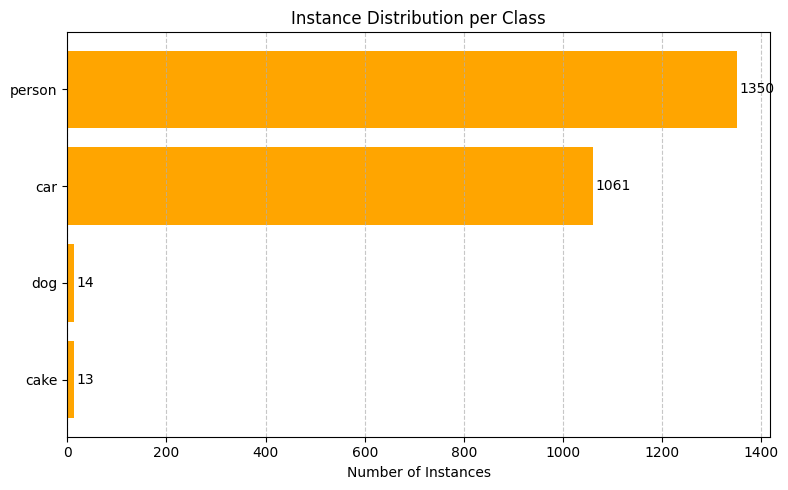

In [63]:
def plot_instance_distribution_bar(coco, target_classes):
    instance_counts = {}                        # Dictionary to hold counts per class

    for cls in target_classes:                  # Loop over each class
        cat_id = coco.getCatIds(catNms=[cls])[0]   # Get COCO category ID
        ann_ids = coco.getAnnIds(catIds=[cat_id])  # Get all annotation IDs for this class
        instance_counts[cls] = len(ann_ids)         # Store number of instances

    # Sort classes by instance count descending for better visualization
    sorted_items = sorted(instance_counts.items(), key=lambda x: x[1], reverse=True)
    classes, counts = zip(*sorted_items)            # Unzip sorted results

    plt.figure(figsize=(8, 5))                   # Create horizontal bar plot
    bars = plt.barh(classes, counts, color='orange')
    plt.xlabel("Number of Instances")             # X-axis label
    plt.title("Instance Distribution per Class")  # Plot title
    plt.grid(axis='x', linestyle='--', alpha=0.7) # Add grid lines on x-axis

    # Add count labels at end of each bar
    for bar in bars:
        width = bar.get_width()                     # Bar length
        plt.text(width + 5,                          # Slightly offset to the right
                 bar.get_y() + bar.get_height()/2,  # Center vertically
                 f'{int(width)}',                    # Text: count as int
                 va='center')

    plt.gca().invert_yaxis()                       # Invert y-axis: largest count on top
    plt.tight_layout()                             # Adjust layout to fit everything nicely
    plt.show()                                     # Display plot

# Call the function to visualize instance distribution
plot_instance_distribution_bar(coco, target_classes)


EDA 3: Object Size Distribution (Histogram)

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


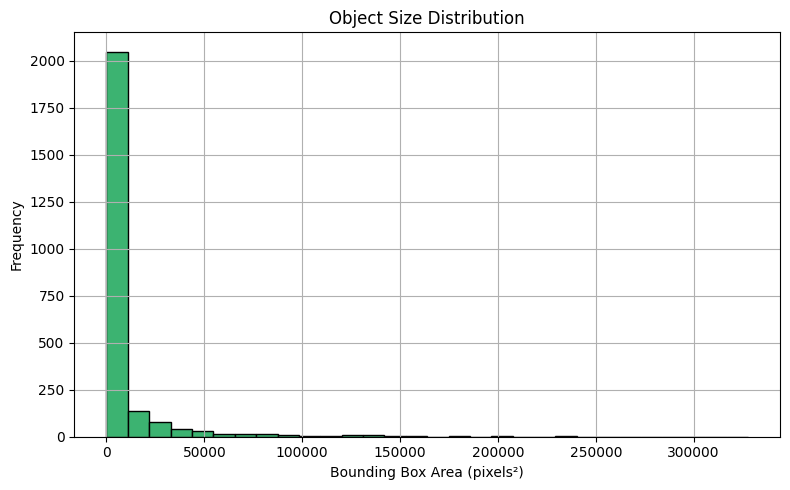

In [ ]:

def plot_object_size_distribution(ann_path, target_classes):
    coco = COCO(ann_path)                     # Load COCO annotations from JSON
    box_areas = []                            # List to store bounding box areas

    for cls in target_classes:                # Loop over each target class
        cat_id = coco.getCatIds(catNms=[cls])[0]  # Get category ID
        ann_ids = coco.getAnnIds(catIds=[cat_id]) # Get all annotation IDs for this class
        anns = coco.loadAnns(ann_ids)              # Load annotations

        for ann in anns:                       # Loop through each annotation
            bbox = ann['bbox']                 # Get bounding box [x, y, width, height]
            area = bbox[2] * bbox[3]           # Calculate area (width * height)
            box_areas.append(area)             # Add area to list

    # Plot histogram of bounding box areas
    plt.figure(figsize=(8, 5))                # Set figure size
    plt.hist(box_areas, bins=30, color='mediumseagreen', edgecolor='black')  # Plot histogram
    plt.title("Object Size Distribution")     # Plot title
    plt.xlabel("Bounding Box Area (pixels²)") # X-axis label
    plt.ylabel("Frequency")                    # Y-axis label
    plt.grid(True)                            # Add grid for readability
    plt.tight_layout()                       # Adjust layout for neatness
    plt.show()                              # Show plot

# Call the function to display plot
plot_object_size_distribution(train_ann_path, target_classes)


Dataset Preparation and Visualization

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Filtered dataset size: 300
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
Filtered dataset size: 300


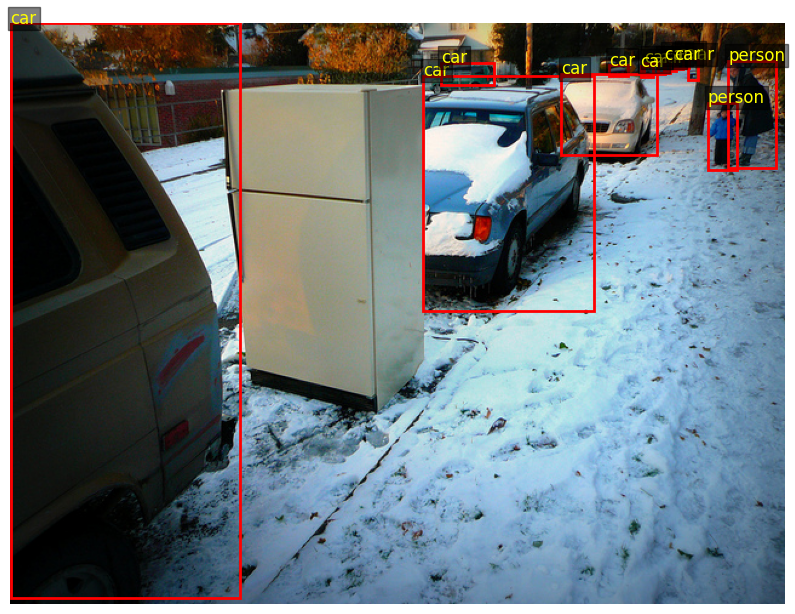

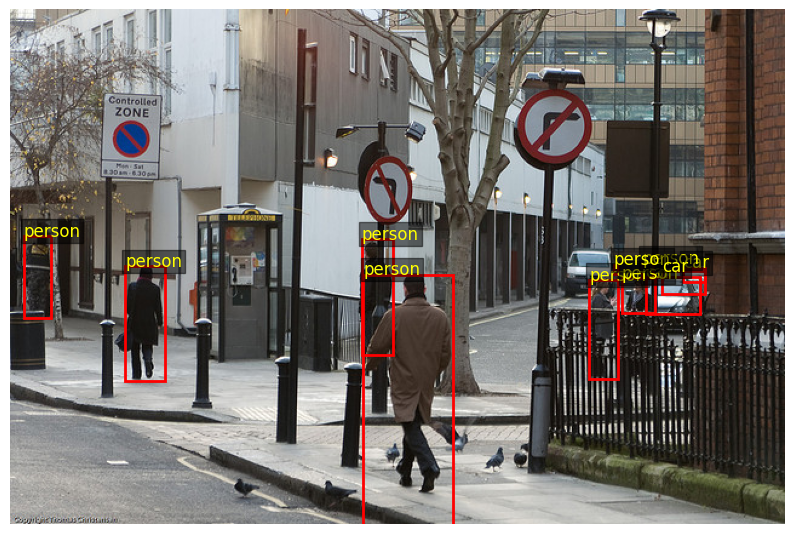

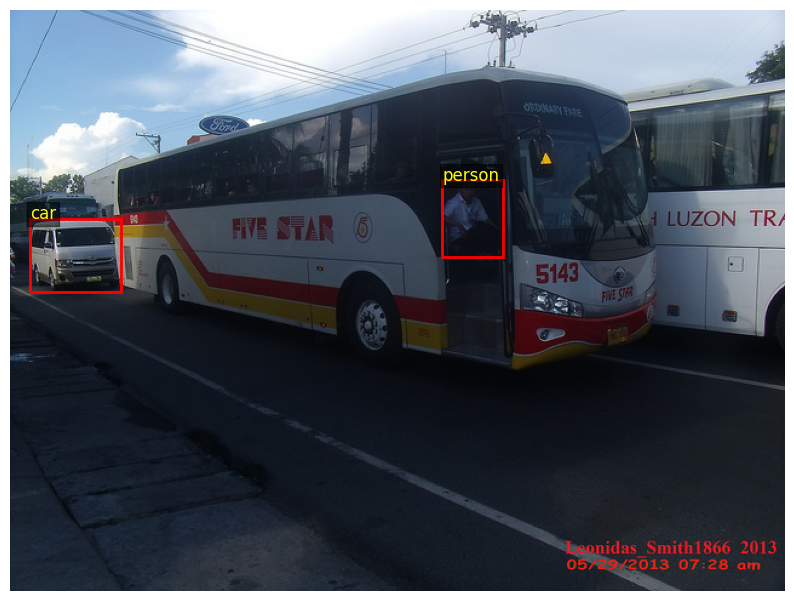

Dataset samples visualization completed successfully.


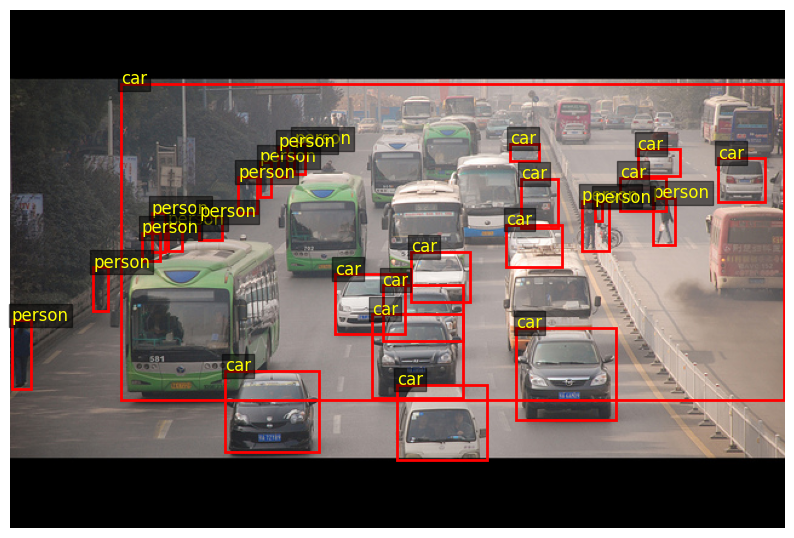

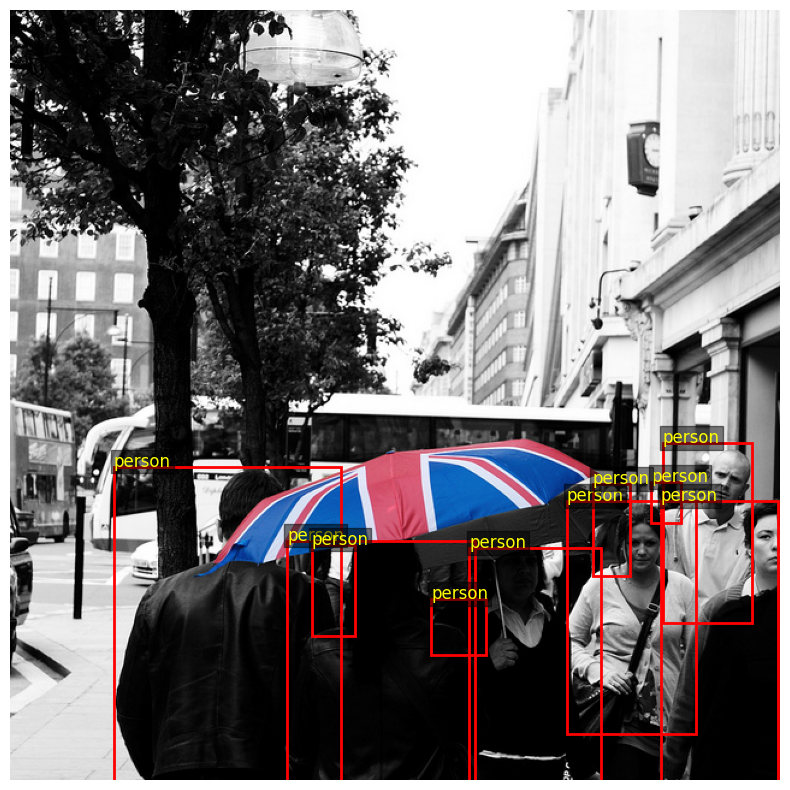

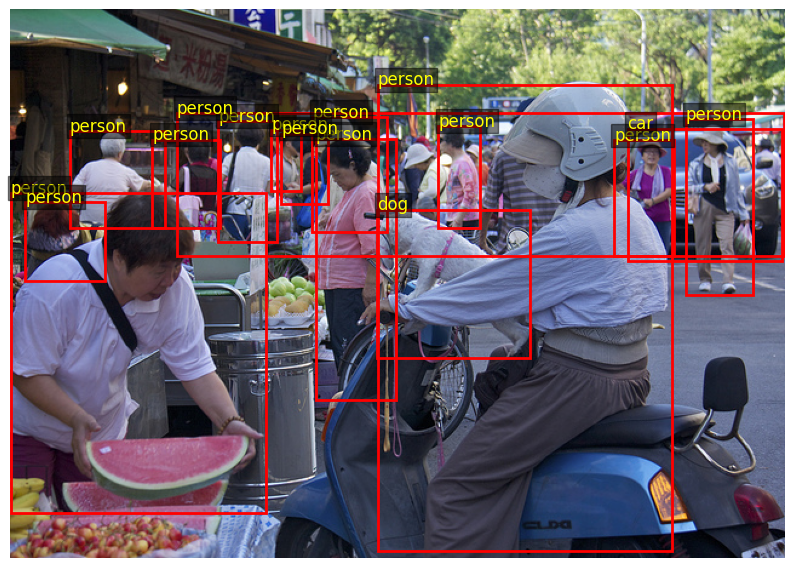

Dataset samples visualization completed successfully.
Test dataset size: 30


In [ ]:

class CocoSubsetDataset(Dataset):
    def __init__(self, img_dir, ann_path, target_classes, transforms=None):
        self.img_dir = img_dir                              # Folder with images
        self.coco = COCO(ann_path)                          # Load COCO annotations
        self.transforms = transforms                        # Optional image transforms
        self.target_classes = target_classes                # List of classes to keep
        # Map target classes to COCO category IDs
        self.cat_ids = [self.coco.getCatIds(catNms=[cls])[0] for cls in target_classes]

        # Collect image IDs that contain at least one target class
        img_ids = set()
        for cat_id in self.cat_ids:
            img_ids.update(self.coco.getImgIds(catIds=[cat_id]))
        self.img_ids = list(img_ids)                         # Convert to list

        print(f"Filtered dataset size: {len(self.img_ids)}") # Print dataset size

    def __len__(self):
        return len(self.img_ids)                             # Total number of images

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]                           # Get image ID at index
        img_info = self.coco.loadImgs(img_id)[0]            # Load image metadata
        img_path = os.path.join(self.img_dir, img_info['file_name'])  # Image filepath

        image = cv2.imread(img_path)                         # Read image using OpenCV
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)      # Convert BGR to RGB

        # Get annotation IDs for this image & target classes
        ann_ids = self.coco.getAnnIds(imgIds=img_id, catIds=self.cat_ids)
        anns = self.coco.loadAnns(ann_ids)                  # Load annotations

        boxes, labels, masks = [], [], []
        for ann in anns:
            x, y, w, h = ann['bbox']                         # COCO bbox format [x,y,w,h]
            boxes.append([x, y, x + w, y + h])               # Convert to [x1,y1,x2,y2]
            # Label is index in target_classes +1 (0 reserved for background)
            labels.append(self.cat_ids.index(ann['category_id']) + 1)
            masks.append(self.coco.annToMask(ann))           # Get binary mask

        # Convert lists to torch tensors with appropriate types
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        masks = torch.as_tensor(np.stack(masks), dtype=torch.uint8)

        # Prepare target dictionary for model input
        target = {
            'boxes': boxes,
            'labels': labels,
            'masks': masks,
            'image_id': torch.tensor([img_id])
        }

        # Apply image transforms if provided
        if self.transforms:
            image = self.transforms(image)

        return image, target

def visualize_dataset_samples(dataset, sample_size=3):
    """Visualize random sample images with bounding boxes and labels."""
    if len(dataset) == 0:
        print("Dataset is empty.")
        return

    sample_size = min(sample_size, len(dataset))         # Limit sample size to dataset length
    sampled_indices = random.sample(range(len(dataset)), sample_size)  # Random indices

    for idx in sampled_indices:
        image, target = dataset[idx]                      # Get image and annotations

        # Convert tensor image to numpy for plotting if needed
        image_np = image.permute(1, 2, 0).numpy() if torch.is_tensor(image) else image

        plt.figure(figsize=(10, 10))
        plt.imshow(image_np)
        plt.axis('off')

        boxes = target['boxes'].numpy()                    # Bounding boxes numpy array
        labels = target['labels'].numpy()                  # Labels numpy array

        for box, label in zip(boxes, labels):
            x1, y1, x2, y2 = box
            # Draw bounding box
            plt.gca().add_patch(plt.Rectangle(
                (x1, y1), x2 - x1, y2 - y1,
                fill=False, edgecolor='red', linewidth=2))
            # Draw label text (label-1 to get original class index)
            label_text = dataset.target_classes[label - 1] if label > 0 else "background"
            plt.text(x1, y1, label_text, fontsize=12, color='yellow',
                     bbox=dict(facecolor='black', alpha=0.5, pad=2))

        plt.show()

    print("Dataset samples visualization completed successfully.")

# Initialize datasets (replace these variables with actual paths and class list)
train_dataset = CocoSubsetDataset(train_img_dir, train_ann_path, target_classes, transforms=None)
val_dataset = CocoSubsetDataset(val_img_dir, val_ann_path, target_classes, transforms=None)

# Visualize random samples from train and validation datasets
visualize_dataset_samples(train_dataset, sample_size=3)
visualize_dataset_samples(val_dataset, sample_size=3)

# Dataset class for test images (no annotations)
class TestImageDataset(Dataset):
    def __init__(self, img_dir, transforms=None):
        self.img_dir = img_dir
        # List of image files with valid extensions
        self.img_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        self.transforms = transforms

    def __len__(self):
        return len(self.img_files)                        # Number of test images

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_files[idx])   # Image filepath
        image = cv2.imread(img_path)                     # Read image
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

        if self.transforms:
            image = self.transforms(image)               # Apply transforms if any

        return image, self.img_files[idx]                 # Return image and filename

# Initialize test dataset
test_dataset = TestImageDataset(test_img_dir, transforms=None)

print(f"Test dataset size: {len(test_dataset)}")        # Print test dataset size


Data Transforms and DataLoader Setup

In [38]:
def get_transform(train):
    transforms = [T.ToTensor()]              # convert image to tensor
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))  # random flip for train only
    return T.Compose(transforms)              # combine transforms

train_dataset = CocoSubsetDataset(train_img_dir, train_ann_path, target_classes, transforms=get_transform(True))  # train dataset
val_dataset = CocoSubsetDataset(val_img_dir, val_ann_path, target_classes, transforms=get_transform(False))     # val dataset

def collate_fn(batch):
    return tuple(zip(*batch))                # collate function for dataloader

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)    # train loader
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, collate_fn=collate_fn)       # val loader


loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Filtered dataset size: 300
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Filtered dataset size: 300


 Model Initialization and Optimizer Setup

In [40]:
def get_model_instance_segmentation(num_classes):
    model = maskrcnn_resnet50_fpn(weights="DEFAULT")  # load pretrained model
    in_features = model.roi_heads.box_predictor.cls_score.in_features  # get input features for box predictor
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)  # replace box predictor

    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels  # get input features for mask predictor
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, 256, num_classes)  # replace mask predictor

    return model

model = get_model_instance_segmentation(NUM_CLASSES).to(device)  # create model and send to device

optimizer = torch.optim.SGD([p for p in model.parameters() if p.requires_grad],  # setup optimizer
                            lr=0.001, momentum=0.9, weight_decay=0.0001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)  # learning rate scheduler


Training and Evaluation Functions for Mask R-CNN

In [45]:
def train_one_epoch(model, optimizer, data_loader, device):
    model.train()  # set model to training mode
    total_loss = 0
    for images, targets in tqdm(data_loader):  # loop over batches
        images = [img.to(device) for img in images]  # send images to device
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]  # send targets to device

        loss_dict = model(images, targets)  # forward pass, get losses dict
        losses = sum(loss for loss in loss_dict.values())  # sum all losses
        total_loss += losses.item()  # accumulate loss

        optimizer.zero_grad()  # zero gradients
        losses.backward()  # backpropagation
        optimizer.step()  # update weights
    return total_loss / len(data_loader)  # return average loss

def evaluate(model, data_loader, device):
    model.train()  # temporarily set to train mode to get loss
    total_loss = 0
    with torch.no_grad():  # no gradients for validation
        for images, targets in tqdm(data_loader):
            images = [img.to(device) for img in images]  # send images to device
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]  # send targets to device
            loss_dict = model(images, targets)  # forward pass
            losses = sum(loss for loss in loss_dict.values())  # sum losses
            total_loss += losses.item()  # accumulate
    model.eval()  # set back to eval mode
    return total_loss / len(data_loader)  # return average loss


Model Training Loop

In [46]:
num_epochs = 10
best_val_loss = float('inf')  # initialize best validation loss
patience = 3  # early stopping patience
counter = 0  # counts epochs with no improvement

train_losses, val_losses = [], []

for epoch in range(num_epochs):
    torch.cuda.empty_cache()  # clear GPU memory

    train_loss = train_one_epoch(model, optimizer, train_loader, device)  # train one epoch
    val_loss = evaluate(model, val_loader, device)  # evaluate on validation set

    train_losses.append(train_loss)  # save train loss
    val_losses.append(val_loss)      # save validation loss

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {train_loss:.4f} | Validation Loss: {val_loss:.4f}")

    # Save best model if validation loss improves
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "/content/drive/MyDrive/Colab Notebooks/Ass/best_model.pth")
        print("Best model saved!")
        counter = 0  # reset early stopping counter
    else:
        counter += 1  # increase counter if no improvement
        print(f"Early stopping patience: {counter}/{patience}")
        if counter >= patience:  # stop training if patience exceeded
            print("Early stopping triggered.")
            break

    scheduler.step()  # update learning rate

print("Training Complete.")


100%|██████████| 300/300 [00:43<00:00,  6.86it/s]


Epoch 1/10
Train Loss: 1.1934 | Validation Loss: 0.9780
Best model saved!


100%|██████████| 300/300 [00:43<00:00,  6.85it/s]


Epoch 2/10
Train Loss: 1.2111 | Validation Loss: 0.9667
Best model saved!


100%|██████████| 300/300 [00:44<00:00,  6.79it/s]


Epoch 3/10
Train Loss: 1.1065 | Validation Loss: 0.9089
Best model saved!


100%|██████████| 300/300 [00:44<00:00,  6.81it/s]


Epoch 4/10
Train Loss: 1.1184 | Validation Loss: 0.9251
Early stopping patience: 1/3


100%|██████████| 300/300 [00:44<00:00,  6.78it/s]


Epoch 5/10
Train Loss: 1.1040 | Validation Loss: 0.9465
Early stopping patience: 2/3


100%|██████████| 300/300 [00:44<00:00,  6.79it/s]

Epoch 6/10
Train Loss: 1.1074 | Validation Loss: 0.9456
Early stopping patience: 3/3
Early stopping triggered.
Training Complete.


Saving Final Model

In [47]:
# After training loop finishes (early stop or full run), save the final model state
torch.save(model.state_dict(), "/content/drive/MyDrive/Colab Notebooks/Ass/final_model.pth")
print("Final model saved successfully.")


Final model saved successfully.


Training and Validation Metrics Visualization

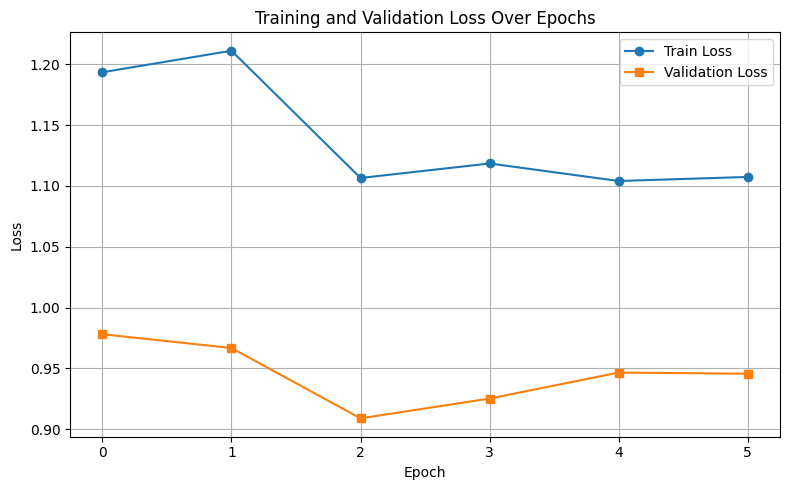

In [48]:
plt.figure(figsize=(8, 5))                # set figure size
plt.plot(train_losses, label="Train Loss", marker='o')   # plot training loss
plt.plot(val_losses, label="Validation Loss", marker='s') # plot validation loss
plt.title("Training and Validation Loss Over Epochs")    # add title
plt.xlabel("Epoch")                     # x-axis label
plt.ylabel("Loss")                      # y-axis label
plt.legend()                           # show legend
plt.grid(True)                         # show grid
plt.tight_layout()                    # adjust layout to prevent overlap
plt.show()                           # display plot


Prediction and Visualization Function

No confident detections in image: 000000001371.jpg
No confident detections in image: 000000001380.jpg
No confident detections in image: 000000001385.jpg
No confident detections in image: 000000001410.jpg


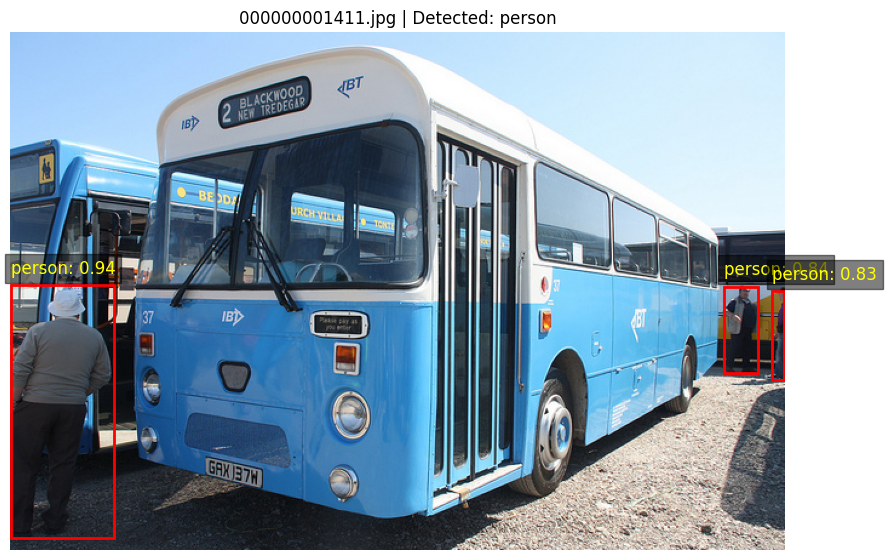

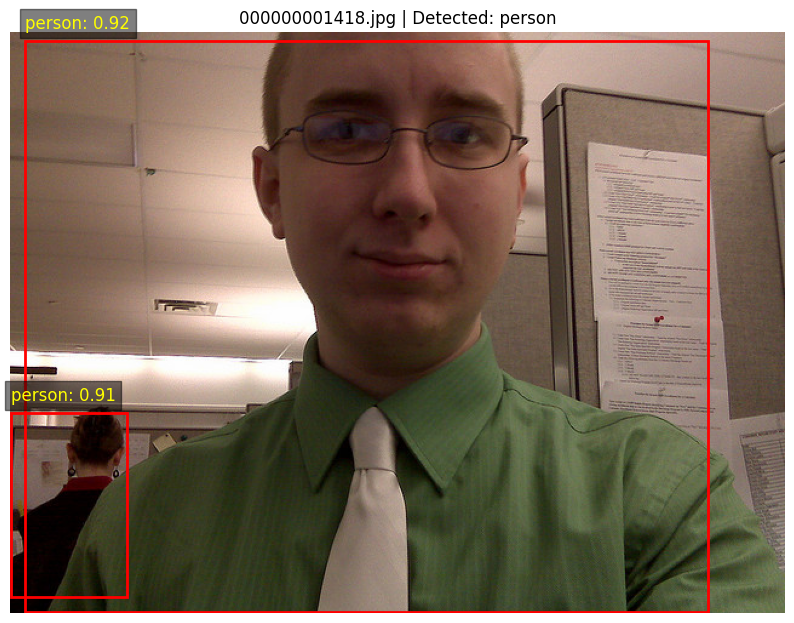

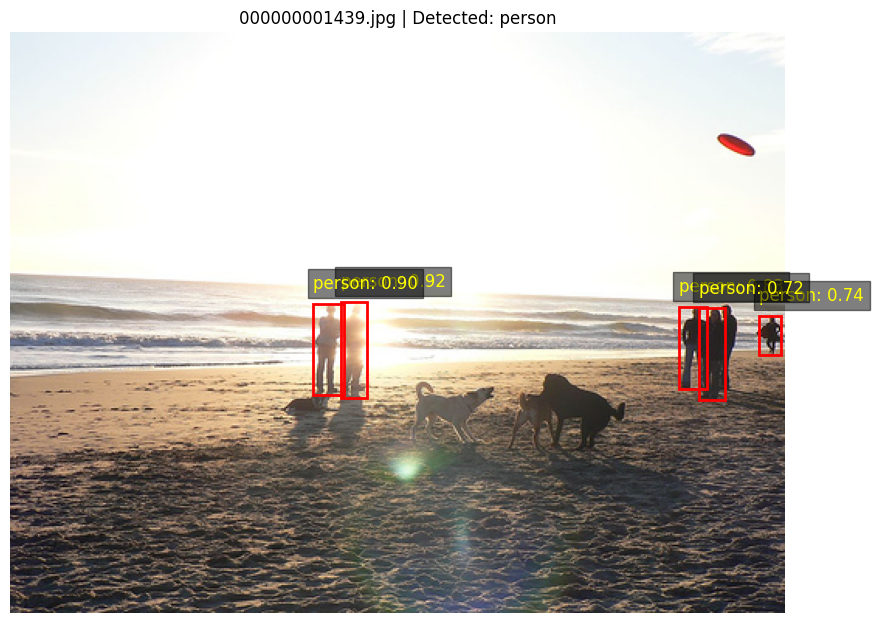

No confident detections in image: 000000001444.jpg


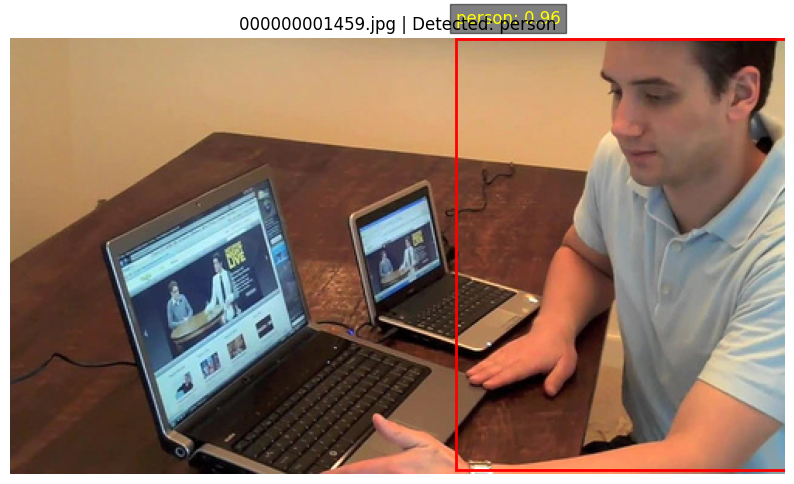

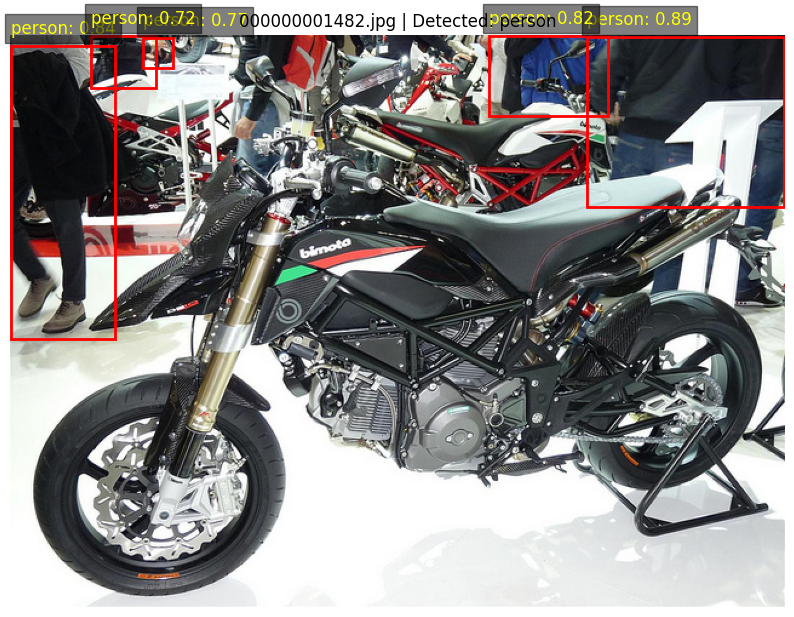

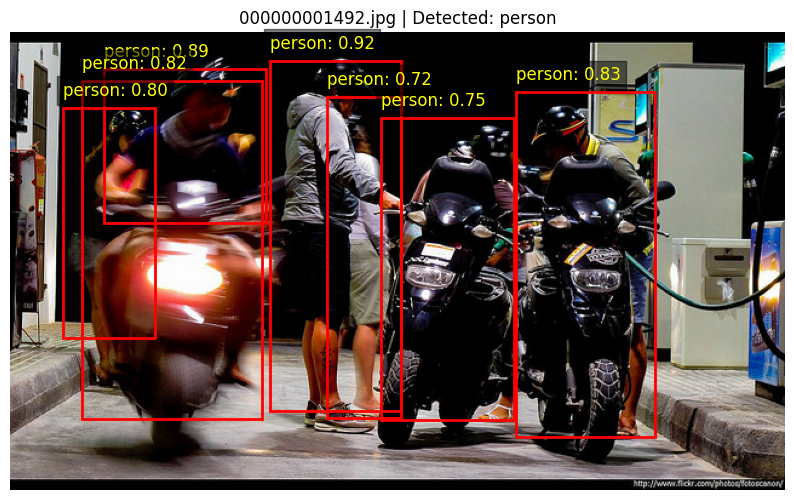

No confident detections in image: 000000001494.jpg
No confident detections in image: 000000001550.jpg


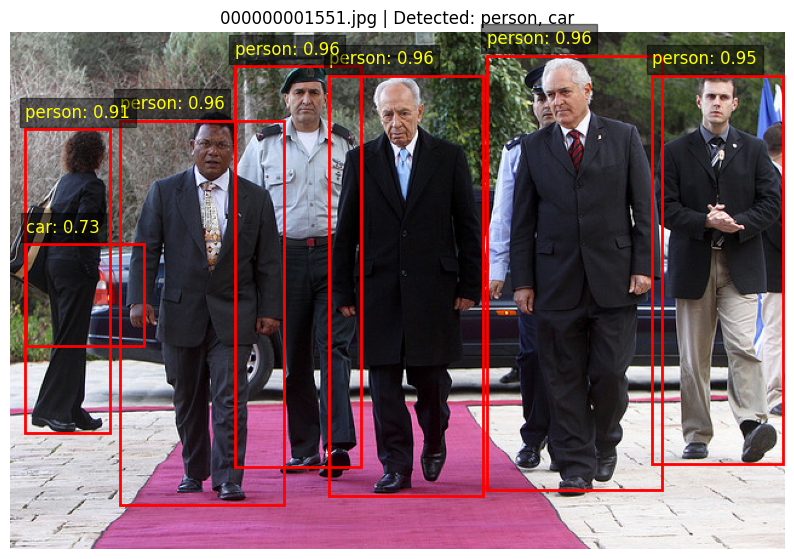

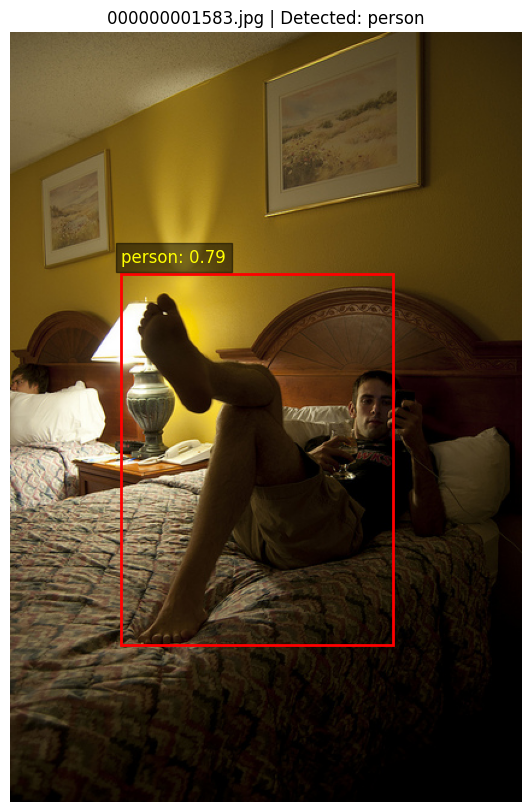

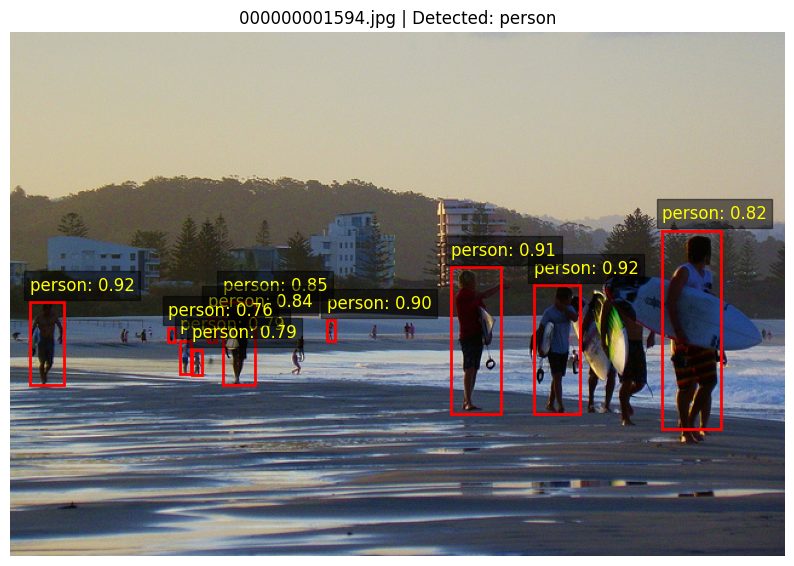

No confident detections in image: 000000001600.jpg


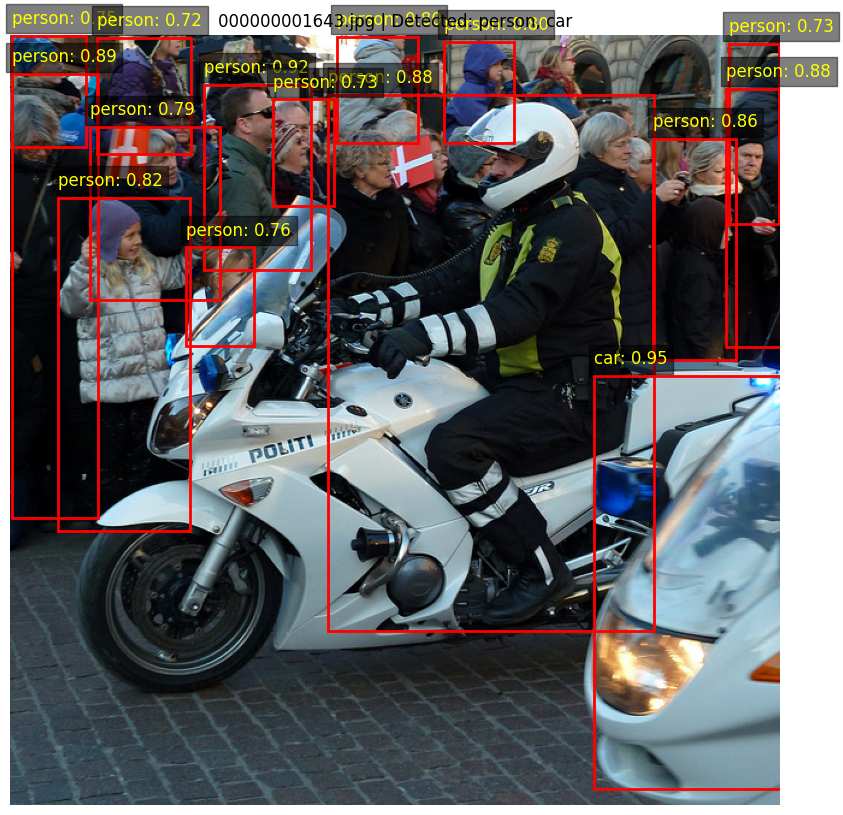

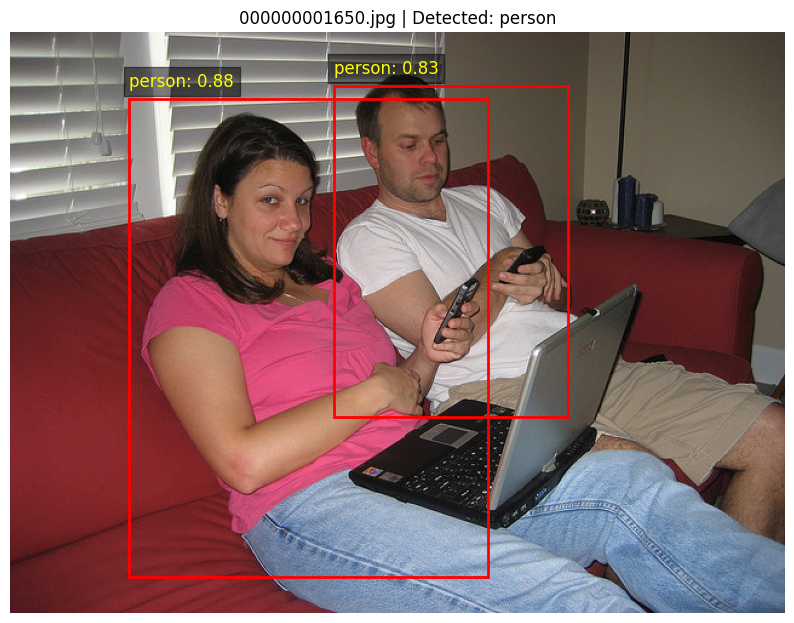

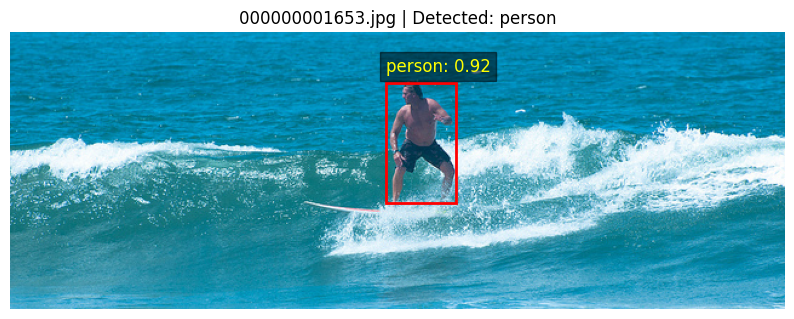

No confident detections in image: 000000001654.jpg
No confident detections in image: 000000001657.jpg


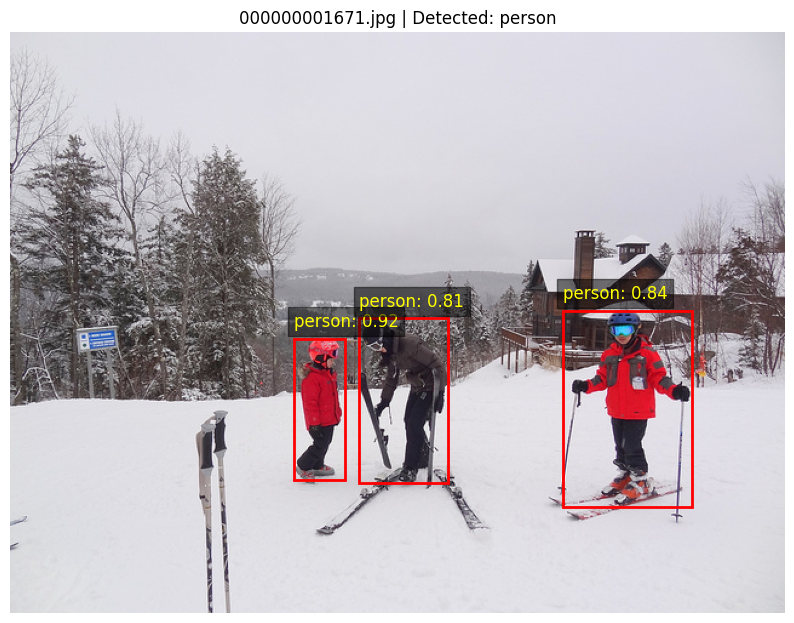

No confident detections in image: 000000001685.jpg
No confident detections in image: 000000001702.jpg
No confident detections in image: 000000001717.jpg


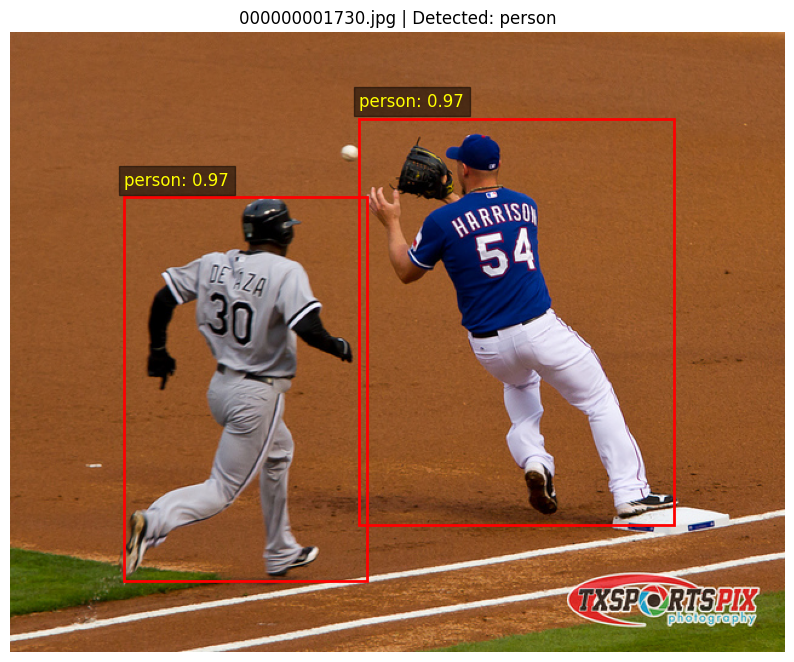

No confident detections in image: 000000001750.jpg


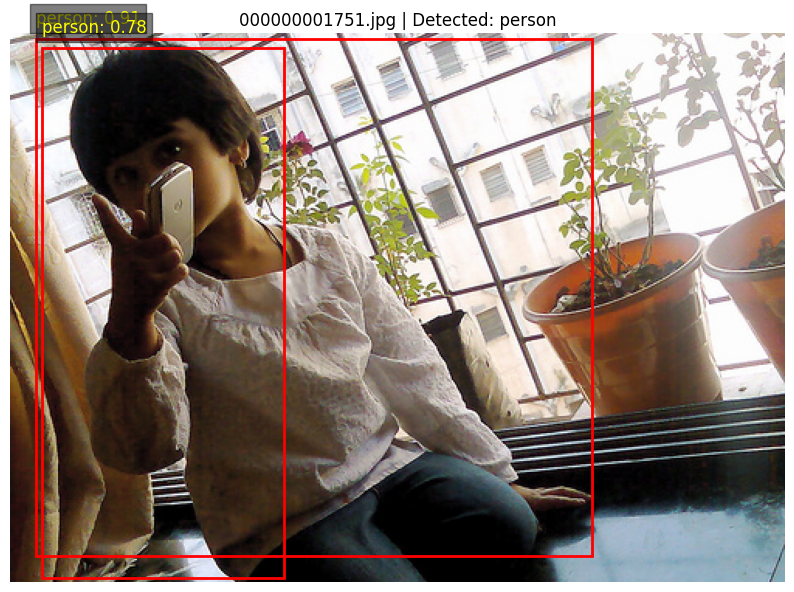

No confident detections in image: 000000001773.jpg


In [64]:


def predict_and_visualize_all(model, img_dir, target_classes, device, score_threshold=0.72):
    model.eval()                             # Set model to evaluation mode
    test_images = sorted(os.listdir(img_dir))  # Get sorted list of test images

    for img_name in test_images:
        img_path = os.path.join(img_dir, img_name)
        image = Image.open(img_path).convert("RGB")   # Open image and convert to RGB
        img_tensor = to_tensor(image).to(device)      # Convert to tensor and send to device

        with torch.no_grad():                          # No gradient calculation needed
            prediction = model([img_tensor])[0]       # Predict on image

        boxes = prediction['boxes'].cpu().numpy()    # Get bounding boxes
        scores = prediction['scores'].cpu().numpy()  # Get confidence scores
        labels = prediction['labels'].cpu().numpy()  # Get predicted labels

        keep = scores >= score_threshold              # Filter predictions by score threshold
        boxes = boxes[keep]
        scores = scores[keep]
        labels = labels[keep]

        if len(boxes) == 0:
            print(f"No confident detections in image: {img_name}")
            continue

        detected_class_names = [target_classes[l - 1] for l in labels]  # Map label IDs to class names

        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.axis('off')

        for box, label, score in zip(boxes, labels, scores):
            x1, y1, x2, y2 = box.astype(int)
            plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                              fill=False, edgecolor='red', linewidth=2))
            plt.text(x1, y1 - 10, f"{target_classes[label - 1]}: {score:.2f}",
                     color='yellow', fontsize=12, bbox=dict(facecolor='black', alpha=0.5))

        plt.title(f"{img_name} | Detected: {', '.join(set(detected_class_names))}")
        plt.show()

# Example usage:
predict_and_visualize_all(model, test_img_dir, target_classes, device)
